<font color="Teal" face="Comic Sans MS,arial">
  <h1 align="center"><i>Ejercicio 4</i></h1>
  </font>
  <font color="Black" face="Comic Sans MS,arial">
  <h5 align="center"><i>estudiante: Lazcano Lagos Jhony Brandon</i></h5>
  <h5 align="center"><i>estudiante: Ramírez Montes Jonathan Natael</i></h5>
  <h5 align="center"><i>Análisis Multivariado</i></h5>
  </font>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statistics import mode
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from IPython.display import display, HTML
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as shc
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [2]:
def plot_confusion_matrix(plt,y_true, y_pred, figsize=(10,10), font_size=16):
    cm = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=np.unique(y_true), columns=np.unique(y_true))
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(cm, cmap= "Blues", annot=annot, fmt='', ax=ax, annot_kws={"size": font_size})

In [3]:
rel_path = './datasets/'
prestamos = pd.read_csv(rel_path + 'prestamos.csv')

Veamos que datos tenemos

In [4]:
prestamos.head()

,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,calificacion_creditica,sub_calificiacion_creditica,antiguedad_empleo_aplicante,estaus_vivienda,ingreso_anual,estado_credito
0,5000,5000,4975.0,36,10.65%,162.87,B,B2,10+,Renta,24000.0,pagado
1,2500,2500,2500.0,60,15.27%,59.83,C,C4,< 1,Renta,30000.0,impago
2,2400,2400,2400.0,36,15.96%,84.33,C,C5,10+,Renta,12252.0,pagado
3,10000,10000,10000.0,36,13.49%,339.31,C,C1,10+,Renta,49200.0,pagado
4,5000,5000,5000.0,36,7.90%,156.46,A,A4,3,Renta,36000.0,pagado


In [5]:
prestamos.dtypes

monto_principal                  int64
monto_fondeado                   int64
fondo_inversion                float64
plazo                            int64
tasa_interes                    object
cuota_mensual                  float64
calificacion_creditica          object
sub_calificiacion_creditica     object
antiguedad_empleo_aplicante     object
estaus_vivienda                 object
ingreso_anual                  float64
estado_credito                  object
dtype: object

In [6]:
rango=len(prestamos.index)
rango

38577

Veamos si tenemos datos nulos

In [7]:
prestamos.isnull().sum()

monto_principal                   0
monto_fondeado                    0
fondo_inversion                   0
plazo                             0
tasa_interes                      0
cuota_mensual                     0
calificacion_creditica            0
sub_calificiacion_creditica       0
antiguedad_empleo_aplicante    1033
estaus_vivienda                   0
ingreso_anual                     0
estado_credito                    0
dtype: int64

Cambiaremos los valores nulos por la moda ya que es una variable de tipo object

In [8]:
moda=mode(prestamos["antiguedad_empleo_aplicante"])

In [9]:
prestamos1=prestamos.replace(np.nan,moda)
prestamos1.isnull().sum()

monto_principal                0
monto_fondeado                 0
fondo_inversion                0
plazo                          0
tasa_interes                   0
cuota_mensual                  0
calificacion_creditica         0
sub_calificiacion_creditica    0
antiguedad_empleo_aplicante    0
estaus_vivienda                0
ingreso_anual                  0
estado_credito                 0
dtype: int64

Revisemos como se comportan los datos.

In [10]:
prestamos1.describe()

,monto_principal,monto_fondeado,fondo_inversion,plazo,cuota_mensual,ingreso_anual
count,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,3.857700e+04
mean,11047.025430,10784.058506,10222.481123,41.898437,322.466318,6.877797e+04
std,7348.441646,7090.306027,7022.720644,10.333136,208.639215,6.421868e+04
min,500.000000,500.000000,0.000000,36.000000,15.690000,4.000000e+03
25%,5300.000000,5200.000000,5000.000000,36.000000,165.740000,4.000000e+04
50%,9600.000000,9550.000000,8733.440000,36.000000,277.860000,5.886800e+04
75%,15000.000000,15000.000000,14000.000000,36.000000,425.550000,8.200000e+04
max,35000.000000,35000.000000,35000.000000,60.000000,1305.190000,6.000000e+06


In [11]:
display(prestamos1.corr())

,monto_principal,monto_fondeado,fondo_inversion,plazo,cuota_mensual,ingreso_anual
monto_principal,1.000000,0.981790,0.937922,0.346650,0.932260,0.268999
monto_fondeado,0.981790,1.000000,0.956172,0.324893,0.958035,0.264798
fondo_inversion,0.937922,0.956172,1.000000,0.343922,0.905464,0.251981
plazo,0.346650,0.324893,0.343922,1.000000,0.090456,0.043866
cuota_mensual,0.932260,0.958035,0.905464,0.090456,1.000000,0.267842
ingreso_anual,0.268999,0.264798,0.251981,0.043866,0.267842,1.000000


<AxesSubplot:>

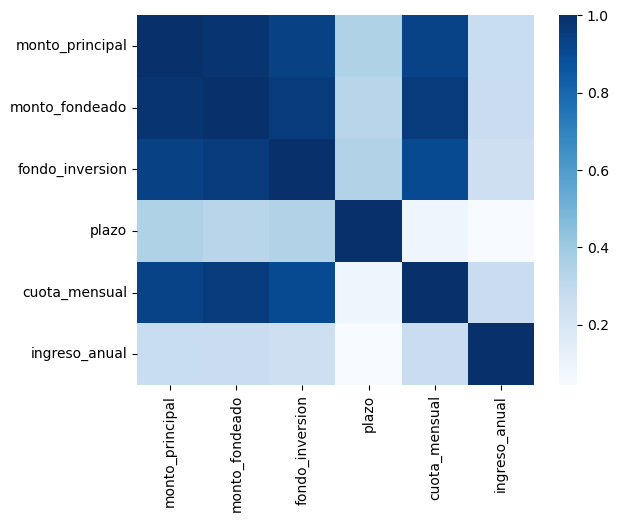

In [12]:
sns.heatmap(prestamos.corr(),cmap="Blues")

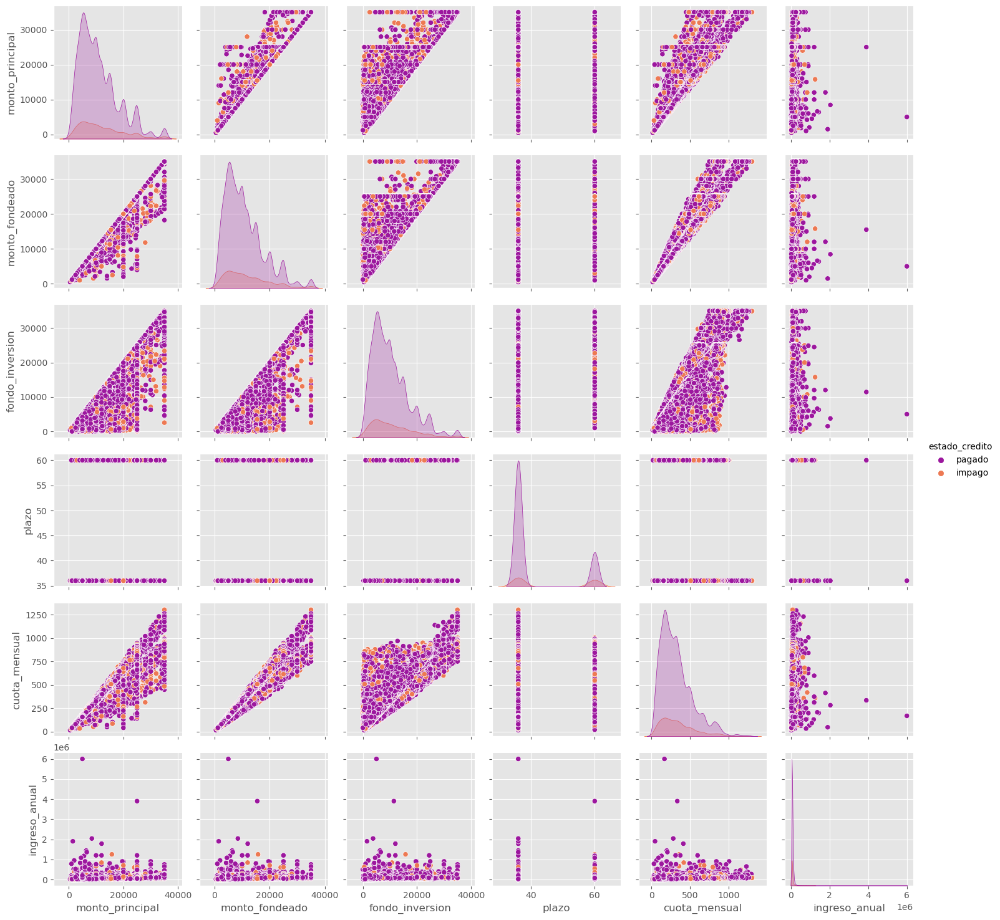

In [13]:
plt.style.use('ggplot')

smp = sns.pairplot(prestamos1,hue="estado_credito",diag_kind='kde',palette="plasma")

A simple vista no podemos apreciar una buena separación de los datos

# Generando nuevas variables

Transformaramos la variable "tasa_interes" para poder trabajar con ella

In [14]:
tasa=[]
for i in range(rango):
    tasa.append(float(str(prestamos1["tasa_interes"][i]).replace("%","")))

In [15]:
prestamos1["tasa_interes"]=tasa
prestamos1

,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,calificacion_creditica,sub_calificiacion_creditica,antiguedad_empleo_aplicante,estaus_vivienda,ingreso_anual,estado_credito
0,5000,5000,4975.0,36,10.65,162.87,B,B2,10+,Renta,24000.0,pagado
1,2500,2500,2500.0,60,15.27,59.83,C,C4,< 1,Renta,30000.0,impago
2,2400,2400,2400.0,36,15.96,84.33,C,C5,10+,Renta,12252.0,pagado
3,10000,10000,10000.0,36,13.49,339.31,C,C1,10+,Renta,49200.0,pagado
4,5000,5000,5000.0,36,7.90,156.46,A,A4,3,Renta,36000.0,pagado
...,...,...,...,...,...,...,...,...,...,...,...,...
38572,2500,2500,1075.0,36,8.07,78.42,A,A4,4,Hipoteca,110000.0,pagado
38573,8500,8500,875.0,36,10.28,275.38,C,C1,3,Renta,18000.0,pagado
38574,5000,5000,1325.0,36,8.07,156.84,A,A4,< 1,Hipoteca,100000.0,pagado
38575,5000,5000,650.0,36,7.43,155.38,A,A2,< 1,Hipoteca,200000.0,pagado


Veamos si con esta variable se separan mejor los datos

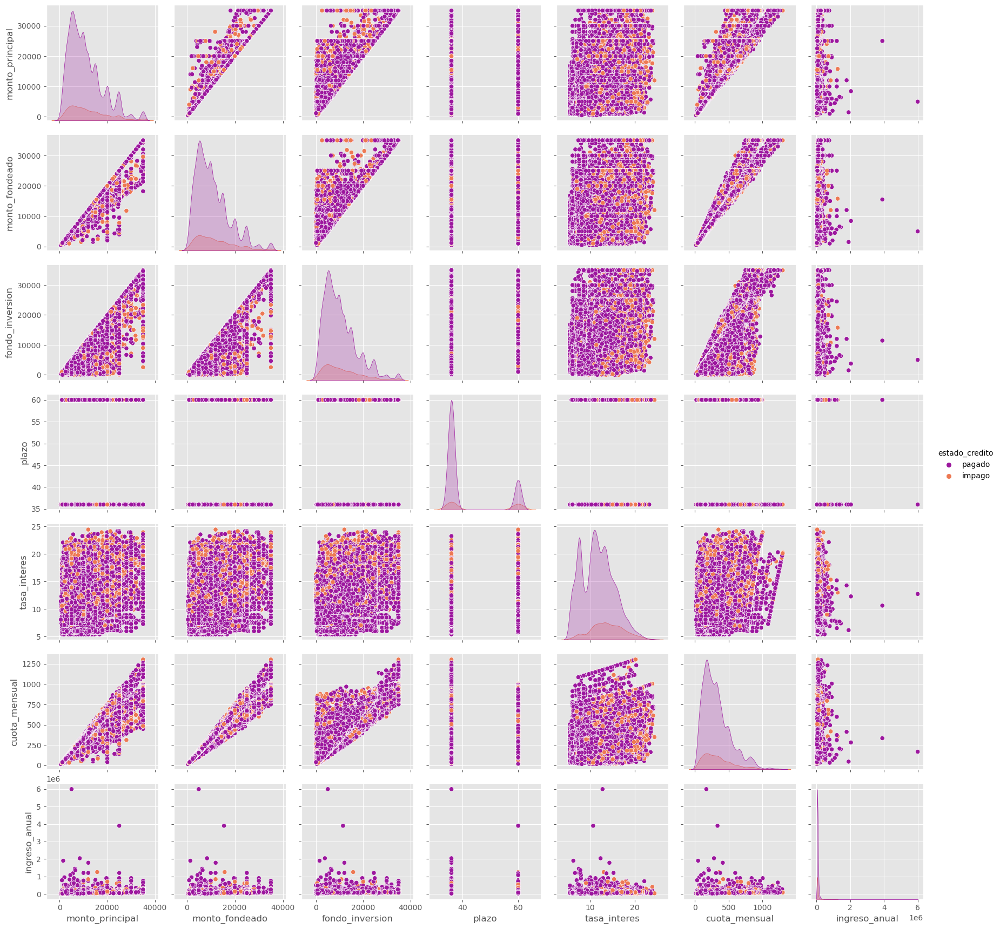

In [16]:
plt.style.use('ggplot')

smp = sns.pairplot(prestamos1,hue="estado_credito",diag_kind='kde',palette="plasma")

#  Estandarizando

In [17]:
colums=["monto_principal", "monto_fondeado","fondo_inversion","tasa_interes","cuota_mensual","ingreso_anual"]
presta=prestamos1[colums]


In [18]:
ss = StandardScaler(with_mean=True,with_std=True).fit(presta)
presta_std = ss.transform(presta) 
prestadf_std = pd.DataFrame(presta_std, columns = colums)
prestadf_std["estado_credito"]=prestamos1["estado_credito"]
prestadf_std

,monto_principal,monto_fondeado,fondo_inversion,tasa_interes,cuota_mensual,ingreso_anual,estado_credito
0,-0.822910,-0.815781,-0.747225,-0.347364,-0.764949,-0.697282,pagado
1,-1.163122,-1.168379,-1.099657,0.904234,-1.258822,-0.603850,impago
2,-1.176731,-1.182483,-1.113896,1.091161,-1.141393,-0.880222,pagado
3,-0.142484,-0.110583,-0.031681,0.422017,0.080732,-0.304868,pagado
4,-0.822910,-0.815781,-0.743665,-1.092363,-0.795672,-0.510418,pagado
...,...,...,...,...,...,...,...
38572,-1.163122,-1.168379,-1.302572,-1.046309,-1.169720,0.641909,pagado
38573,-0.346612,-0.322142,-1.331051,-0.447601,-0.225686,-0.790714,pagado
38574,-0.822910,-0.815781,-1.266973,-1.046309,-0.793851,0.486189,pagado
38575,-0.822910,-0.815781,-1.363091,-1.219691,-0.800849,2.043389,pagado


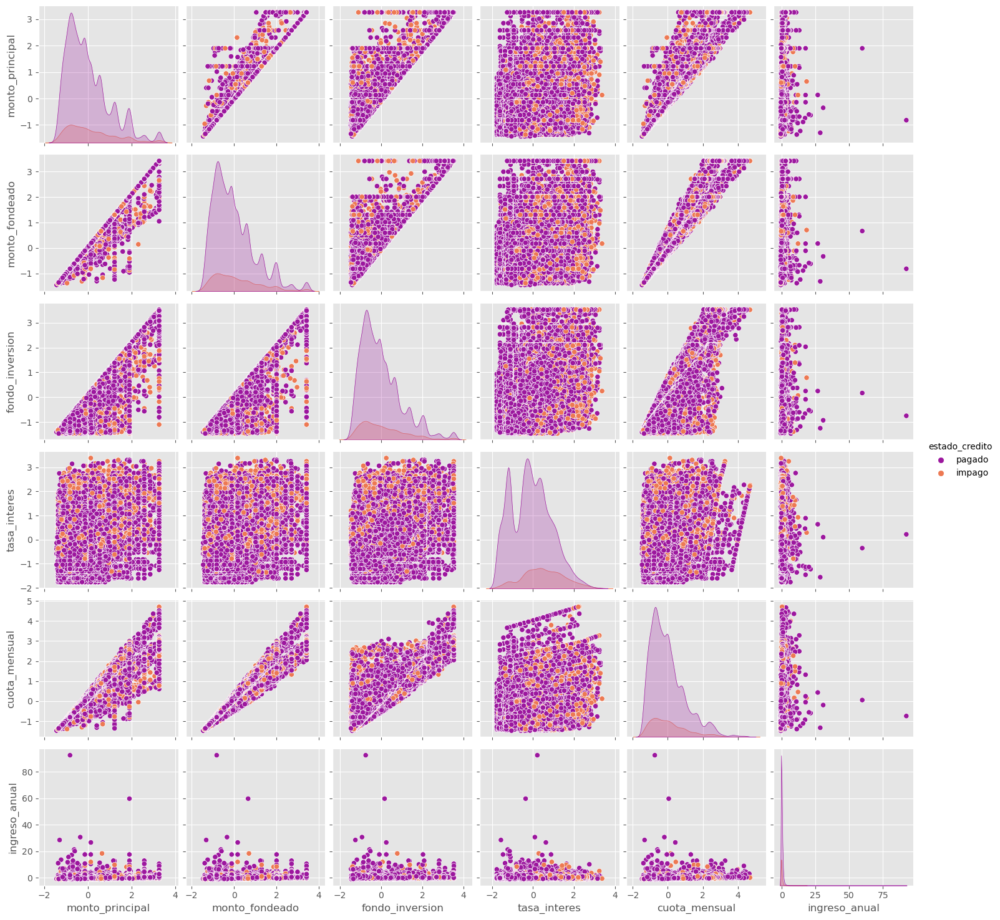

In [19]:
plt.style.use('ggplot')

smp = sns.pairplot(prestadf_std,hue="estado_credito",diag_kind='kde',palette="plasma")

Como podemos ver estandarizar los datos no nos ayuda.

# PCA con datos estandarizados

In [20]:
prestadf_std = pd.DataFrame(presta_std, columns = colums)
k = 6
pca_presta_cols = ['pc'+str(i+1) for i in range(0,k)]
pca_presta_model = PCA(n_components = k).fit(prestadf_std)

trans_presta = pd.DataFrame(data = pca_presta_model.transform(prestadf_std),
                              columns=pca_presta_cols)

pca_presta_all = pd.concat([prestamos1,trans_presta],axis=1)
pca_presta_all[:5]

,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,calificacion_creditica,sub_calificiacion_creditica,antiguedad_empleo_aplicante,estaus_vivienda,ingreso_anual,estado_credito,pc1,pc2,pc3,pc4,pc5,pc6
0,5000,5000,4975.0,36,10.65,162.87,B,B2,10+,Renta,24000.0,pagado,-1.708578,-0.301939,-0.283636,-0.005829,-0.045568,0.008294
1,2500,2500,2500.0,60,15.27,59.83,C,C4,< 1,Renta,30000.0,impago,-2.197751,-1.012251,0.911592,-0.088929,0.013735,-0.016066
2,2400,2400,2400.0,36,15.96,84.33,C,C5,10+,Renta,12252.0,pagado,-2.173500,-1.342670,0.873485,0.013738,-0.041111,0.014492
3,10000,10000,10000.0,36,13.49,339.31,C,C1,10+,Renta,49200.0,pagado,-0.071772,-0.499045,0.156214,0.099153,-0.144937,0.040693
4,5000,5000,5000.0,36,7.90,156.46,A,A4,3,Renta,36000.0,pagado,-1.831458,0.312653,-0.726422,-0.045929,-0.028293,-0.002140


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


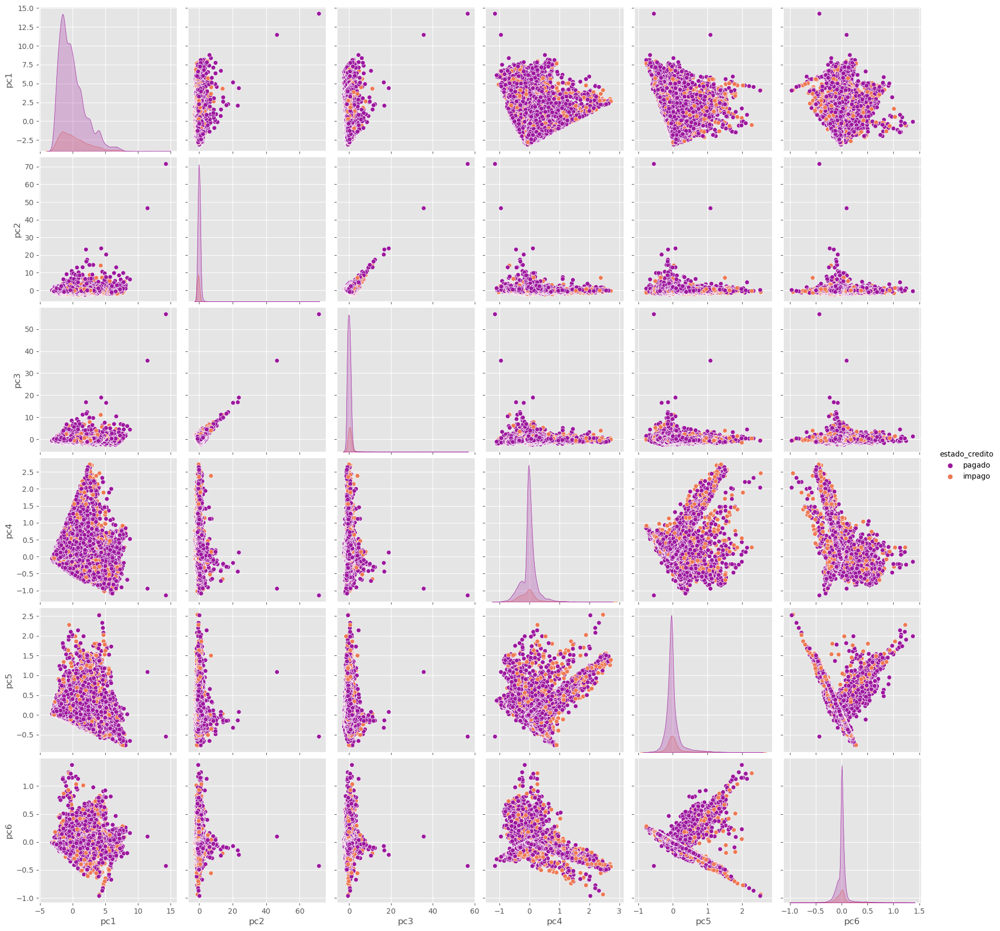

In [21]:
sns.pairplot(pca_presta_all[pca_presta_cols + ['estado_credito']],
             hue='estado_credito',
             size=3,
             palette="plasma");

Tampoco nos ayuda mucho usar PCA con los datos estandarizados

Intentemos con PCA sin estandarizar

# PCA sin estandarizar

In [22]:
prestamos_PCA = pd.DataFrame(prestamos1, columns = colums)
k = 6
pca_presta1_cols = ['pc'+str(i+1) for i in range(0,k)]
pca_presta1_model = PCA(n_components = k).fit(prestamos_PCA)

trans_presta1 = pd.DataFrame(data = pca_presta1_model.transform(prestamos_PCA),
                              columns=pca_presta1_cols)

pca_presta1_all = pd.concat([prestamos1,trans_presta1],axis=1)
pca_presta1_all[:5]

,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,calificacion_creditica,sub_calificiacion_creditica,antiguedad_empleo_aplicante,estaus_vivienda,ingreso_anual,estado_credito,pc1,pc2,pc3,pc4,pc5,pc6
0,5000,5000,4975.0,36,10.65,162.87,B,B2,10+,Renta,24000.0,pagado,-45233.303716,7516.195960,-323.246403,28.759040,-4.981098,-0.414210
1,2500,2500,2500.0,60,15.27,59.83,C,C4,< 1,Renta,30000.0,impago,-39467.130707,12140.218387,-264.290335,65.065212,28.344710,4.529826
2,2400,2400,2400.0,36,15.96,84.33,C,C5,10+,Renta,12252.0,pagado,-57199.863367,11384.664594,-239.441809,69.318926,0.069226,5.285134
3,10000,10000,10000.0,36,13.49,339.31,C,C1,10+,Renta,49200.0,pagado,-19614.460379,171.718342,-546.179294,-37.097820,-40.163726,1.755584
4,5000,5000,5000.0,36,7.90,156.46,A,A4,3,Renta,36000.0,pagado,-33249.023290,8129.746835,-357.749159,30.978318,1.998485,-3.161955


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


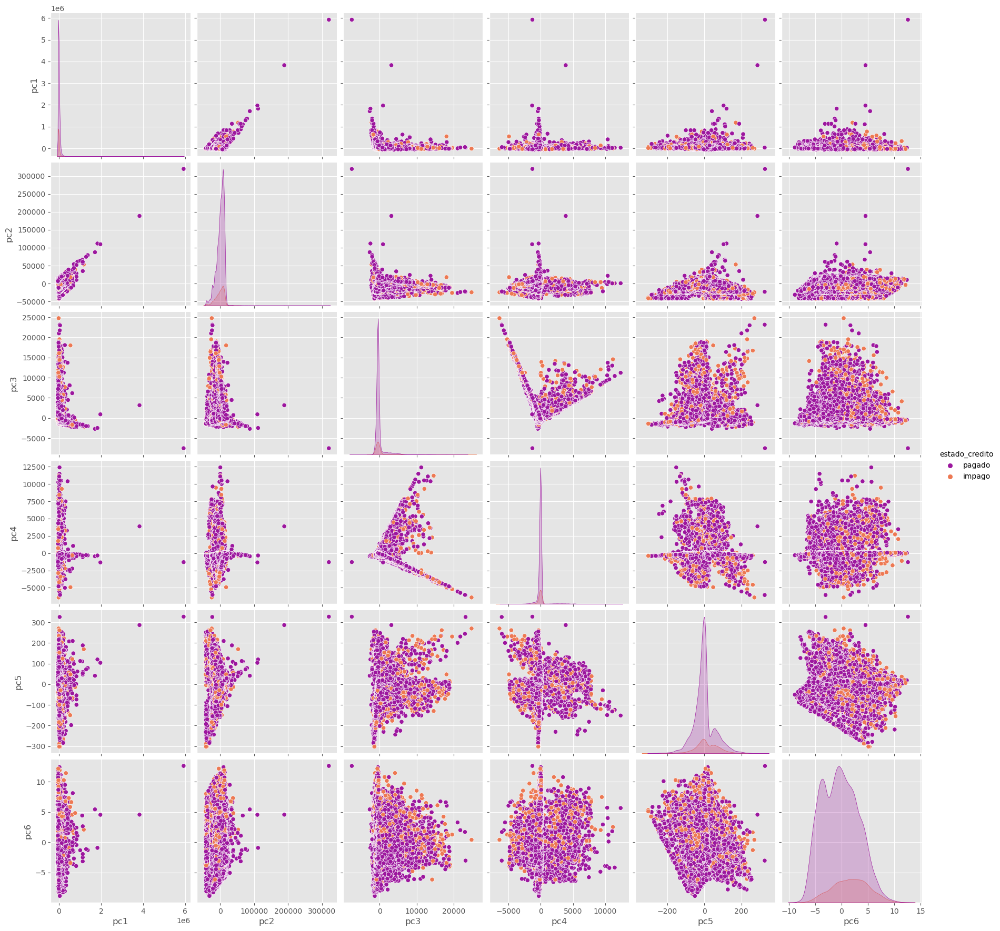

In [23]:
sns.pairplot(pca_presta1_all[pca_presta1_cols + ['estado_credito']],
             hue='estado_credito',
             size=3,
             palette="plasma");

# Usando Logaritmo

In [24]:
prestamos1["monto_principal"]=np.log(prestamos1["monto_principal"])
prestamos1["ingreso_anual"]= np.log(prestamos1["ingreso_anual"])
prestamos1["cuota_mensual"]=np.log(prestamos1["cuota_mensual"])
prestamos1["monto_fondeado"]=np.log(prestamos1["monto_fondeado"])
prestamos1["fondo_inversion"]=np.log(prestamos1["fondo_inversion"])
prestamos1["tasa_interes"]=np.log(prestamos1["tasa_interes"])
prestamos1

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,calificacion_creditica,sub_calificiacion_creditica,antiguedad_empleo_aplicante,estaus_vivienda,ingreso_anual,estado_credito
0,8.517193,8.517193,8.512181,36,2.365560,5.092952,B,B2,10+,Renta,10.085809,pagado
1,7.824046,7.824046,7.824046,60,2.725890,4.091507,C,C4,< 1,Renta,10.308953,impago
2,7.783224,7.783224,7.783224,36,2.770086,4.434738,C,C5,10+,Renta,9.413444,pagado
3,9.210340,9.210340,9.210340,36,2.601949,5.826914,C,C1,10+,Renta,10.803649,pagado
4,8.517193,8.517193,8.517193,36,2.066863,5.052800,A,A4,3,Renta,10.491274,pagado
...,...,...,...,...,...,...,...,...,...,...,...,...
38572,7.824046,7.824046,6.980076,36,2.088153,4.362079,A,A4,4,Hipoteca,11.608236,pagado
38573,9.047821,9.047821,6.774224,36,2.330200,5.618152,C,C1,3,Renta,9.798127,pagado
38574,8.517193,8.517193,7.189168,36,2.088153,5.055226,A,A4,< 1,Hipoteca,11.512925,pagado
38575,8.517193,8.517193,6.476972,36,2.005526,5.045874,A,A2,< 1,Hipoteca,12.206073,pagado


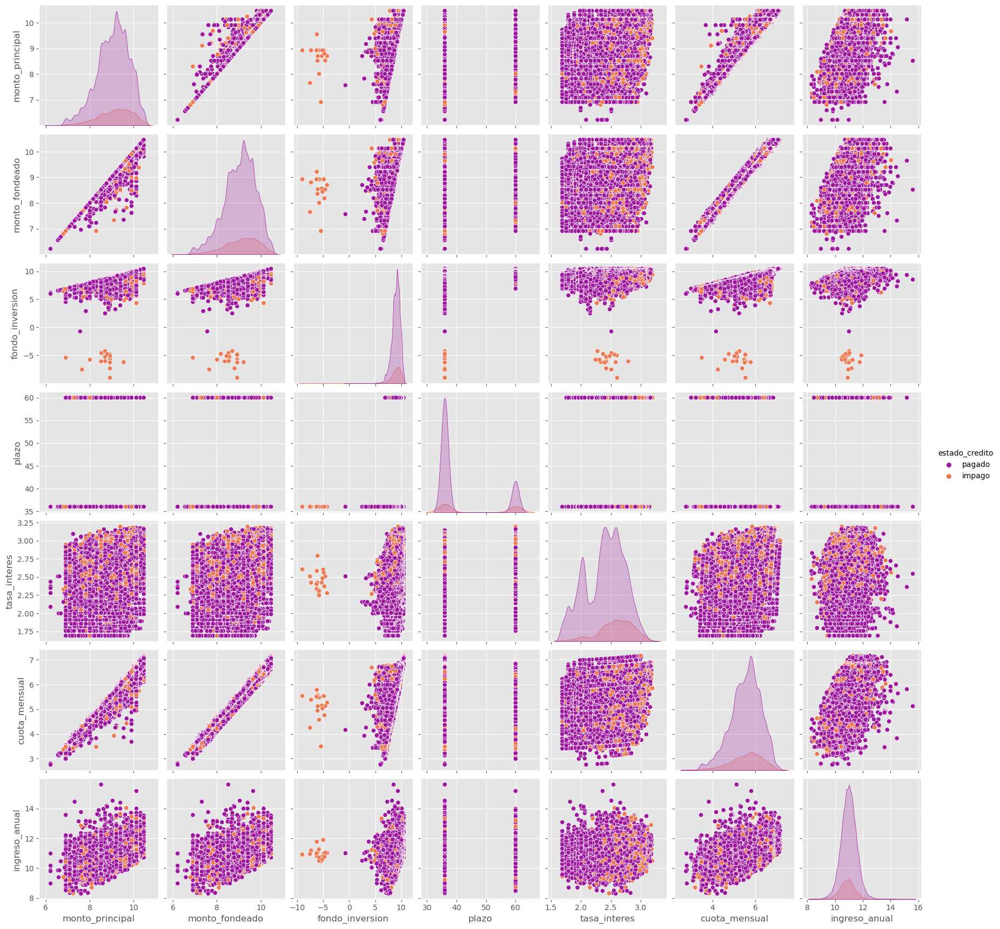

In [25]:
plt.style.use('ggplot')

smp = sns.pairplot(prestamos1,hue="estado_credito",diag_kind='kde',palette="plasma")

Parece que esta transformacion a los datos nos puede ayudar a clasificarlos

# Usando desicion de arbol

Como la variable que separa mejor los datos es fondo_inversion usaremos esta para realizar arboles de corte

In [26]:
colums1=['monto_principal',
 'monto_fondeado',
 'fondo_inversion',
 "plazo",
 'tasa_interes',
 'cuota_mensual',       
 'ingreso_anual',"estado_credito"]

In [27]:
prestamos2=prestamos1[colums1]
prestamos2

,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,ingreso_anual,estado_credito
0,8.517193,8.517193,8.512181,36,2.365560,5.092952,10.085809,pagado
1,7.824046,7.824046,7.824046,60,2.725890,4.091507,10.308953,impago
2,7.783224,7.783224,7.783224,36,2.770086,4.434738,9.413444,pagado
3,9.210340,9.210340,9.210340,36,2.601949,5.826914,10.803649,pagado
4,8.517193,8.517193,8.517193,36,2.066863,5.052800,10.491274,pagado
...,...,...,...,...,...,...,...,...
38572,7.824046,7.824046,6.980076,36,2.088153,4.362079,11.608236,pagado
38573,9.047821,9.047821,6.774224,36,2.330200,5.618152,9.798127,pagado
38574,8.517193,8.517193,7.189168,36,2.088153,5.055226,11.512925,pagado
38575,8.517193,8.517193,6.476972,36,2.005526,5.045874,12.206073,pagado


Generemos nuestra columna target

In [28]:
prestamos2["target"]=prestamos2["estado_credito"]

C:\Users\JHONNY\AppData\Local\Temp\ipykernel_16088\3820275677.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prestamos2["target"]=prestamos2["estado_credito"]


Para poder manipular los datos cambiaresmos  la palabra pagado por 0 e impago por 1

In [29]:
rango=len(prestamos2.index)
target=[]
for i in range(rango):
    target.append(float(str(prestamos2["target"][i]).replace("pagado","0").replace("impago","1")))


In [30]:
prestamos2["estado_credito"]=target
prestamos2["target"]=target
prestamos2

C:\Users\JHONNY\AppData\Local\Temp\ipykernel_16088\3773584818.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prestamos2["estado_credito"]=target
C:\Users\JHONNY\AppData\Local\Temp\ipykernel_16088\3773584818.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prestamos2["target"]=target


,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,ingreso_anual,estado_credito,target
0,8.517193,8.517193,8.512181,36,2.365560,5.092952,10.085809,0.0,0.0
1,7.824046,7.824046,7.824046,60,2.725890,4.091507,10.308953,1.0,1.0
2,7.783224,7.783224,7.783224,36,2.770086,4.434738,9.413444,0.0,0.0
3,9.210340,9.210340,9.210340,36,2.601949,5.826914,10.803649,0.0,0.0
4,8.517193,8.517193,8.517193,36,2.066863,5.052800,10.491274,0.0,0.0
...,...,...,...,...,...,...,...,...,...
38572,7.824046,7.824046,6.980076,36,2.088153,4.362079,11.608236,0.0,0.0
38573,9.047821,9.047821,6.774224,36,2.330200,5.618152,9.798127,0.0,0.0
38574,8.517193,8.517193,7.189168,36,2.088153,5.055226,11.512925,0.0,0.0
38575,8.517193,8.517193,6.476972,36,2.005526,5.045874,12.206073,0.0,0.0


# Generando dataset test

In [31]:
from sklearn.model_selection import train_test_split
prestamos_train,prestamos_test= train_test_split(prestamos2, test_size=0.30, random_state=1)
prestamos_test

,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,ingreso_anual,estado_credito,target
7275,9.090994,9.090994,9.088173,36,1.690096,5.589755,10.308953,0.0,0.0
32094,9.392662,9.392662,9.384294,36,2.190536,5.943482,10.714418,0.0,0.0
30468,8.070906,8.070906,8.070906,36,2.396986,4.651672,11.385092,0.0,0.0
29857,7.824046,7.824046,7.824046,36,2.016235,4.353884,10.819778,0.0,0.0
9119,7.824046,7.824046,7.824046,36,1.944481,4.346270,11.002100,0.0,0.0
...,...,...,...,...,...,...,...,...,...
14570,8.779557,8.779557,8.779557,36,1.790091,5.286852,10.645425,0.0,0.0
15927,8.294050,8.294050,8.287780,36,1.934416,4.815188,11.608236,0.0,0.0
36576,9.615805,9.615805,9.296984,36,2.264883,6.176740,10.915088,0.0,0.0
26727,8.955448,8.955448,8.955448,36,2.697326,5.591174,11.091621,1.0,1.0


convertiremos nuestro dataset en un array para poder aplicarla al algoritmo

In [32]:
prestamos_test=prestamos_test[np.isfinite(prestamos_test[colums]).all(1)]
prestamos_test=prestamos_test.to_numpy()
prestamos_test

array([[ 9.09099361,  9.09099361,  9.08817274, ..., 10.30895266,
         0.        ,  0.        ],
       [ 9.39266193,  9.39266193,  9.38429368, ..., 10.71441777,
         0.        ,  0.        ],
       [ 8.07090609,  8.07090609,  8.07090609, ..., 11.38509209,
         0.        ,  0.        ],
       ...,
       [ 9.61580548,  9.61580548,  9.29698368, ..., 10.91508846,
         0.        ,  0.        ],
       [ 8.95544812,  8.95544812,  8.95544812, ..., 11.09162057,
         1.        ,  1.        ],
       [ 8.98719682,  8.98719682,  8.98719682, ..., 10.59663473,
         1.        ,  1.        ]])

In [33]:
prestamos_test[:,8]

array([0., 0., 0., ..., 0., 1., 1.])

<Figure size 1500x1000 with 0 Axes>

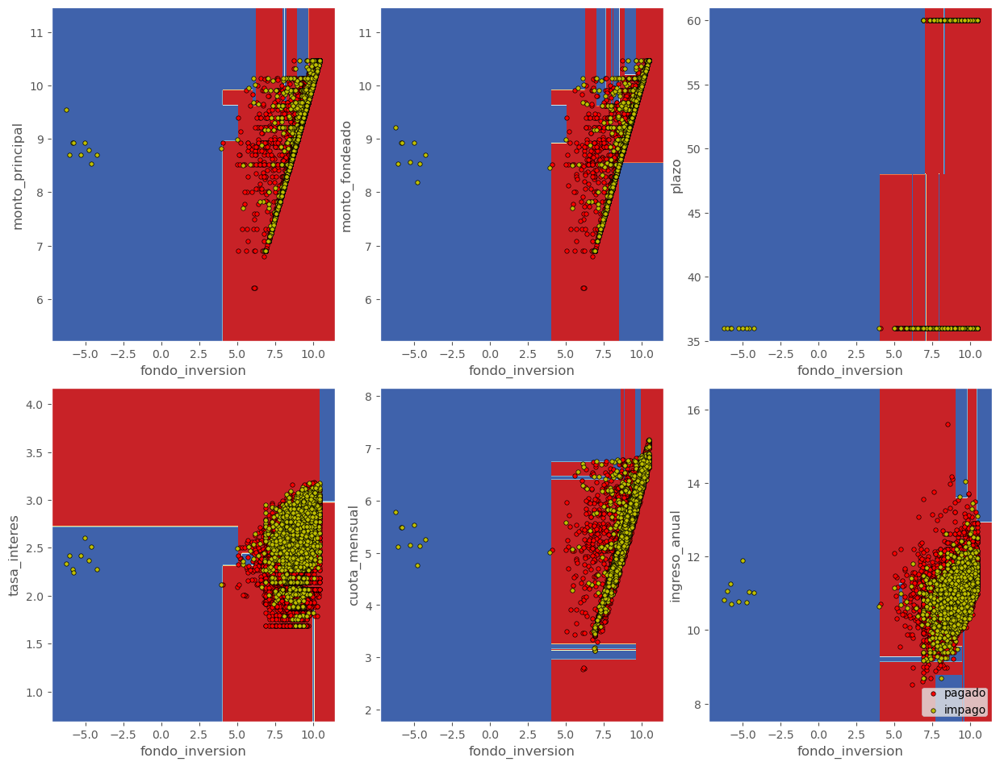

<Figure size 1500x1000 with 0 Axes>

In [34]:
n_classes = 2
plot_colors = "ryb"
plot_step = 0.02
plt.figure(figsize=(13,10))
target=["pagado","impago"]
for pairidx, pair in enumerate([[2,0],[2,1],[2,3],[2,4],[2,5],[2,6]]):
    X = prestamos_test[:, pair]
    y = prestamos_test[:,8]
    clf = DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=7).fit(X, y)
    plt.subplot(2, 3, pairidx + 1)
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step), np.arange(y_min, y_max, plot_step))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)
    plt.xlabel(colums1[pair[0]])
    plt.ylabel(colums1[pair[1]])
    for i, color in zip(range(n_classes), plot_colors):
        idx = np.where(y == i)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, label=target[i],
                    cmap=plt.cm.RdYlBu, edgecolor='black', s=15)

plt.legend(loc='lower right', borderpad=0, handletextpad=0)
plt.axis("tight")
plt.figure(figsize=(15,10))

Como podemos ver las variables que mejor separan son tasa_interes con fondo_inversion

In [35]:
colums1.append("target")

In [36]:
prestamos_test= pd.DataFrame(prestamos_test, columns=colums1)
X = prestamos_test[['tasa_interes','fondo_inversion']]
y = prestamos_test['target']

clf = DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=7).fit(X, y)
score = clf.predict_proba(X)[:,1:]
prestamos_test["score"]=score
prestamos_test.sort_values('score',ascending=True,inplace=True)

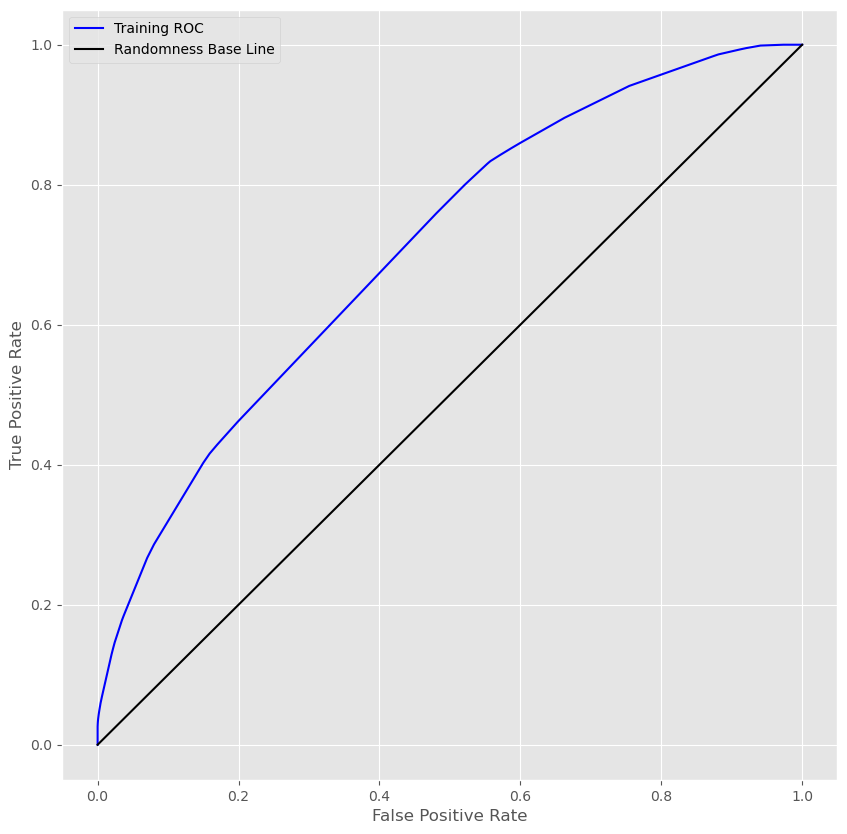

AUC: 0.7088926783848231
GINI: 0.4177853567696461


In [37]:
fpr, tpr, test_thresholds  = roc_curve(prestamos_test['estado_credito'], prestamos_test['score'])

plt.figure(figsize=(10,10))
plt.plot(fpr, tpr, linestyle='-', color='blue', label='Training ROC')
plt.plot([0,1],[0,1], color='black', label='Randomness Base Line')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

print('AUC:',roc_auc_score(prestamos_test['target'],prestamos_test['score']))
print('GINI:',2*roc_auc_score(prestamos_test['target'],prestamos_test['score'])-1)

Podemos ver que se cumple la condicion que necesitamos

In [38]:
prestamos_test['ganancia'] = np.where(prestamos_test['target']==0,prestamos_test.monto_fondeado*prestamos_test.tasa_interes-prestamos_test.monto_fondeado,-prestamos_test.monto_fondeado)
prestamos_test['ganancia_acumulada'] = prestamos_test['ganancia'].cumsum()

threshold_row = prestamos_test[prestamos_test['ganancia_acumulada'] == prestamos_test['ganancia_acumulada'].max()]
display(threshold_row)
threshold_cutoff = threshold_row['score'].values[0]

prestamos_test['target_est'] = np.where(prestamos_test['score']>=threshold_cutoff,1,0)


,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,ingreso_anual,estado_credito,target,score,ganancia,ganancia_acumulada
8801,9.87817,9.87817,9.876887,60.0,2.819592,6.1784,11.355921,0.0,0.0,0.714286,17.974234,111074.750397


Por lo que nuestra maxima ganancia es de 111081.361286 y veamos que la variable target_est no es igual a la de target lo que nos puede dar una idea de la eficacia de nuestro modelo

OPTIMO THRESHOLD QUE CORTA LOS VALORES DE SCORE:


,monto_principal,monto_fondeado,fondo_inversion,plazo,tasa_interes,cuota_mensual,ingreso_anual,estado_credito,target,score,ganancia,ganancia_acumulada
8801,9.87817,9.87817,9.876887,60.0,2.819592,6.1784,11.355921,0.0,0.0,0.714286,17.974234,111074.750397


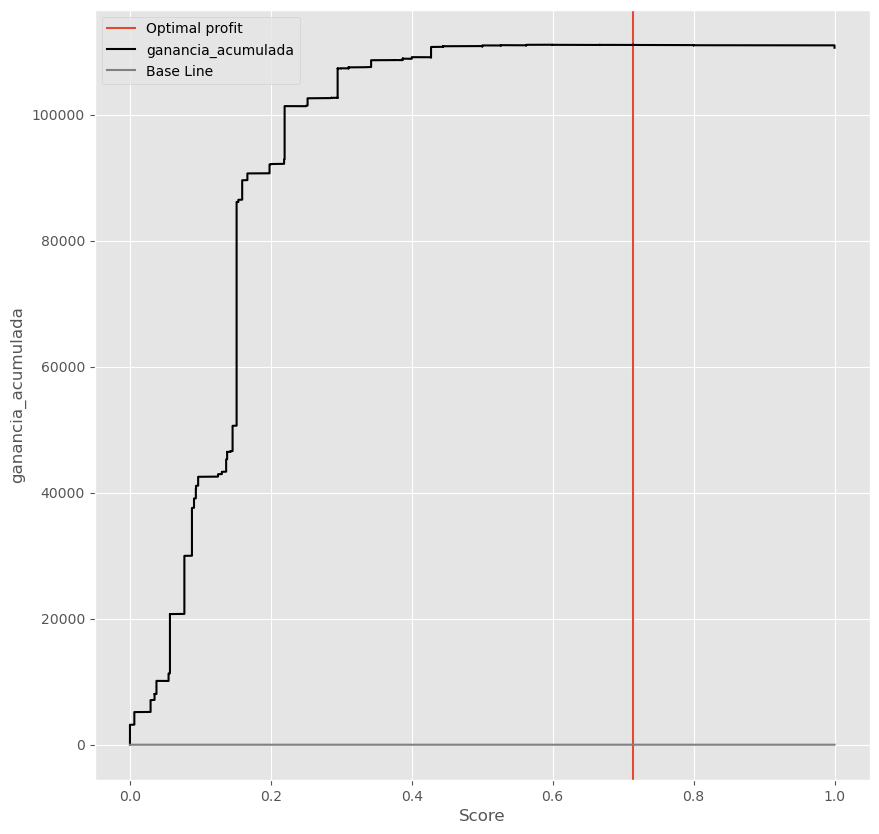

PRECISION: 0.9333333333333333
RECALL: 0.03361344537815126
F1: 0.06488991888760139
ACURACY: 0.8600537587791555
DENIED OPERATIONS: 60
DENIED PERCENTAGE: 0.005202462498916154


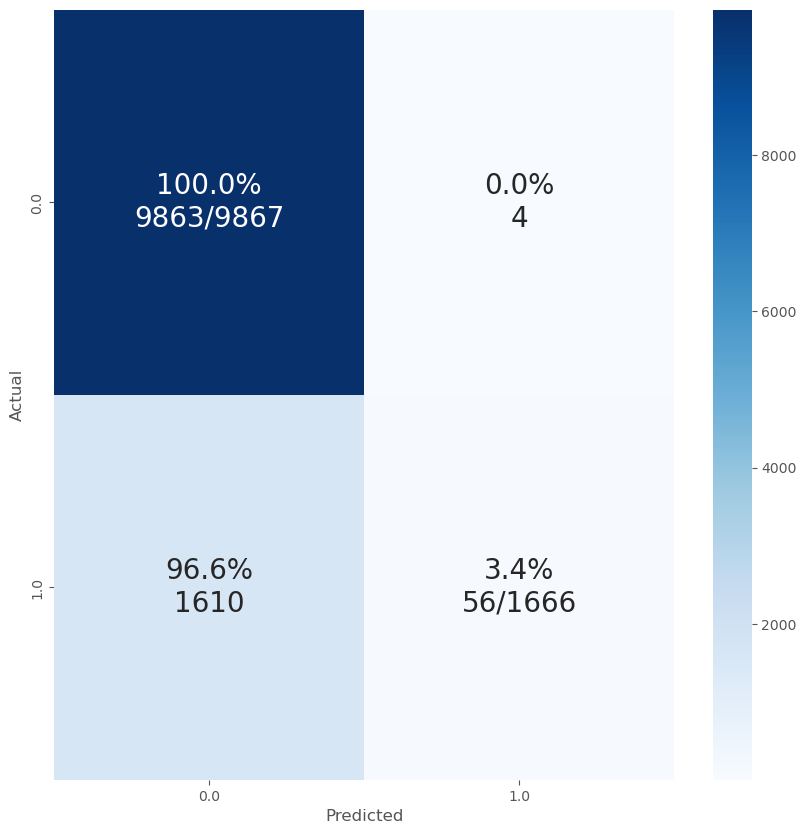

In [39]:
precision = precision_score(prestamos_test['estado_credito'],prestamos_test['target_est'])
recall = recall_score(prestamos_test['estado_credito'],prestamos_test['target_est'])
f1 = f1_score(prestamos_test['estado_credito'],prestamos_test['target_est'])
accuracy = accuracy_score(prestamos_test['estado_credito'],prestamos_test['target_est'])

print('OPTIMO THRESHOLD QUE CORTA LOS VALORES DE SCORE:')
display(threshold_row)

plt.figure(figsize=(10,10))
plt.axvline(x=threshold_cutoff,label='Optimal profit')
plt.plot(prestamos_test['score'].values,prestamos_test['ganancia_acumulada'].values, linestyle='-', color='Black', label='ganancia_acumulada')
plt.plot([1,0],[1,0], linestyle='-', color='Gray', label='Base Line')

plt.xlabel('Score')
plt.ylabel('ganancia_acumulada')
plt.legend()
plt.show()

print('PRECISION:',precision)
print('RECALL:',recall)
print('F1:',f1)
print('ACURACY:',accuracy)
print('DENIED OPERATIONS:',len(prestamos_test[prestamos_test['score']>=threshold_cutoff]))
print('DENIED PERCENTAGE:',len(prestamos_test[prestamos_test['score']>=threshold_cutoff])/len(prestamos_test))

plot_confusion_matrix(plt,prestamos_test['target'],prestamos_test['target_est'],figsize=(10,10),font_size=20)

Veamos que se acerto de manera muy eficaz en los pagados pero no en los impagos